# Source Code Analysis

## Initialization

In [1]:
import os
import sys

def add_path(path):
    if path not in sys.path:
        sys.path.insert(0, path)
        sys.path.append(path)    
add_path('/home/jjian03/anaconda3/lib/python3.7/site-packages')
add_path(f'{os.path.abspath(os.path.join("."))}/lib')


### Load Data

In [2]:
from lib.Repository import *
from lib.Utility import *
from lib.modeling import *
from lib.preprocessing import *
from lib.preprocessing.HTMLParser import html_parser
from lib.viz import *

Allocated 16 CPUs


In [3]:
import time
import datetime
start_time = time.time()
raw_data = DataSource(cache_name = 'trunc_data.csv', truncated=True, fract=.04).raw_data

raw_data.info()

print(f'raw_data: {shape(raw_data)}')

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

2.3.0.cloudera3
Sample Size - raw_data: 14673
Initialized
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14673 entries, 0 to 14672
Data columns (total 36 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   id                                      14673 non-null  object 
 1   url                                     14673 non-null  object 
 2   actual_scrape_url                       14673 non-null  object 
 3   first_appear                            14673 non-null  float64
 4   first_available_timestamp               0 non-null      float64
 5   last_available_timestamp                14673 non-null  float64
 6   header                                  14673 non-null  object 
 7   html_text                               14673 non-null  object 
 8   comment                                 14673 non-null  object 
 9   from_waybackmachine                     14673 non-null  int32  
 10  

### Train Test Split

In [4]:
start_time = time.time()

train_data = DataSource().train_data
test_data = DataSource().test_data


print('Shape of the dataframe:')
print(f'train_data: {shape(train_data)}')
print(f'test_data: {len(test_data)}')

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

Shape of the dataframe:
train_data: (10271, 36)
test_data: 4402
--- 00 minutes, 0.00 seconds ---


## Feature Engineering

### Build Pipeline

In [5]:
display(pd.DataFrame({
    'unique count': print_unique_count(train_data),
    'na count': print_na_count(train_data)
}, index=train_data.columns))

,unique count,na count
id,9828,0
url,9828,0
actual_scrape_url,9804,0
first_appear,22,0
first_available_timestamp,1,10271
last_available_timestamp,9799,0
header,9828,0
html_text,7158,0
comment,2281,0
from_waybackmachine,2,0


## Modeling

### Elastic Net Regression

#### Model - 1st Edition

In [6]:
from feature_engine import categorical_encoders

pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('binary_na_encoder', BinaryNAEncoder(['content_type'])),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'is_port_access',
#                                         'first_appear',
#                                         'has_content_type',
                                        'label'
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['protocol_type'])),
    # Low Variance Filter works incorrectly.
    ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
    ('feature_remover', FeatureRemover([
                                        'param_cnt',
                                        'is_port_access',
                                       ])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)

Index(['protocol_type', 'has_www', 'url_depth', 'subdomain_level', 'suffix'], dtype='object')
Index(['protocol_type', 'has_www', 'url_depth', 'subdomain_level', 'suffix'], dtype='object')


In [7]:
import numpy as np
from sklearn.linear_model import ElasticNet


start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 1.89%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.6565,0.098,16.901,0.000
protocol_type,0.7447,0.106,7.007,0.000
suffix,0.0264,0.029,0.913,0.361
has_www,-0.0000,0.057,-0.000,1.000
subdomain_level,-0.0031,0.030,-0.105,0.916
url_depth,-0.2049,0.025,-8.077,0.000



R^2 on Testing Set: 1.98%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.6565,0.147,11.304,0.000
protocol_type,0.7447,0.161,4.621,0.000
suffix,0.0264,0.044,0.596,0.551
has_www,-0.0000,0.087,-0.000,1.000
subdomain_level,-0.0031,0.045,-0.069,0.945
url_depth,-0.2049,0.039,-5.229,0.000


--- 00 minutes, 16.54 seconds ---


In [8]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': result_train.best_result.residual
}), "Residual Distribution", height=400)


In [9]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': result_train.best_result.residual,
    'prediction': result_train.best_result.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': result_test.best_result.residual,
    'prediction': result_test.best_result.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


The residual is approximately normal distributed. But the shape of the residual-prediction scatter plot shows that the data space might not linear correlated with the dependent variable (which agrees with the r^2 score). 

##### EDA

- Scatter distribution on each features

In [10]:
Visualizer.plot_scatter_distribution(X_train, y_train, 'Training Set Scatter Plot')


In [11]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 00 minutes, 23.24 seconds ---


In [12]:
def build_visualization_matrix(result_train, result_test):
    performance_matrix_train = pd.DataFrame()
    performance_matrix_train['alpha'] = pd.Series(result_train.performance_matrix).apply(lambda x: x.params['alpha'][0])
    performance_matrix_train['mse'] = pd.Series(result_train.performance_matrix).apply(lambda x: x.mse)
    performance_matrix_train['r_2'] = pd.Series(result_train.performance_matrix).apply(lambda x: x.r_2)
    for col_name in result_train.performance_matrix[0].rpt.index.tolist():
        performance_matrix_train[col_name] = pd.Series(result_train.performance_matrix).apply(lambda x: x.rpt.loc[col_name, 'Coefficients'])
    performance_matrix_train['type'] = 'Train'

    performance_matrix_test = pd.DataFrame()
    performance_matrix_test['alpha'] = pd.Series(result_test.performance_matrix).apply(lambda x: x.params['alpha'][0])
    performance_matrix_test['mse'] = pd.Series(result_test.performance_matrix).apply(lambda x: x.mse)
    performance_matrix_test['r_2'] = pd.Series(result_test.performance_matrix).apply(lambda x: x.r_2)
    for col_name in result_train.performance_matrix[0].rpt.index.tolist():
        performance_matrix_test[col_name] = pd.Series(result_test.performance_matrix).apply(lambda x: x.rpt.loc[col_name, 'Coefficients'])
    performance_matrix_test['type'] = 'Test'

    performance_matrix = pd.DataFrame()
    performance_matrix = performance_matrix.append(performance_matrix_train)
    performance_matrix = performance_matrix.append(performance_matrix_test)

    return performance_matrix

performance_matrix = build_visualization_matrix(result_train, result_test)

In [13]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [14]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 432x288 with 0 Axes>

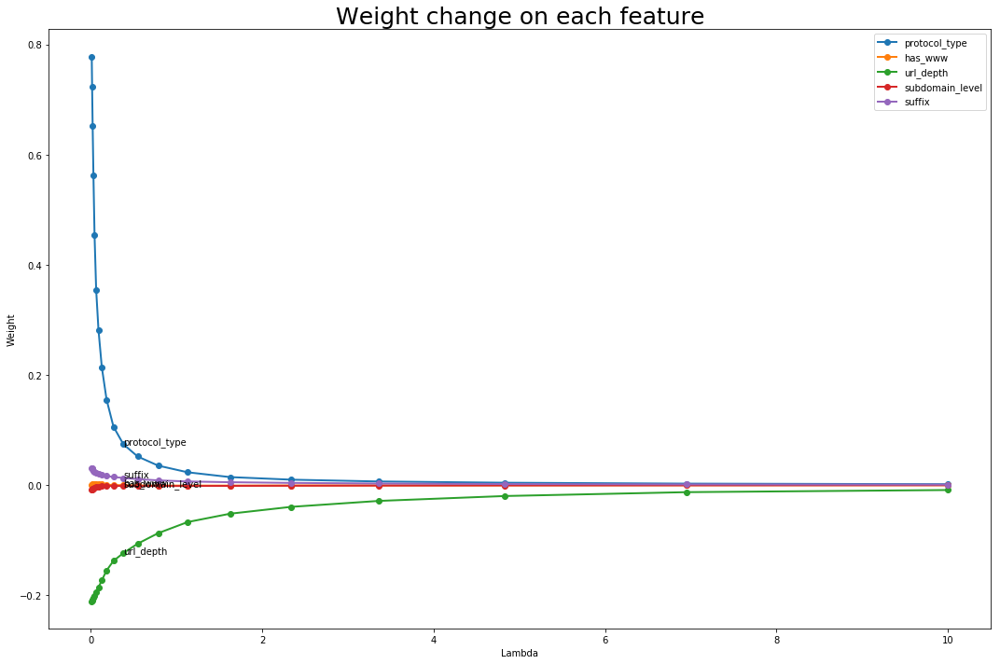

In [15]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

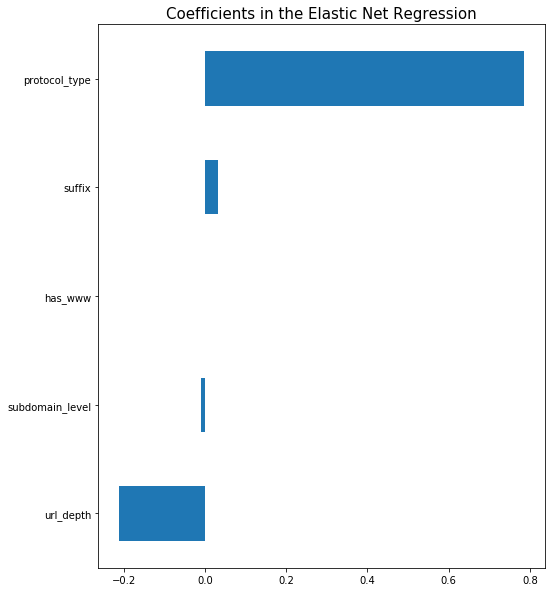

In [16]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

#### Model - 2nd Edition

##### Try encode the suffix index label with logarithm

In [17]:
pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('binary_na_encoder', BinaryNAEncoder(['content_type'])),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'is_port_access',
#                                         'first_appear',
#                                         'has_content_type',
                                        'label'
                                       ])),
    ('logarithm_transformer', LogarithmTransformer(['suffix'])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['protocol_type'])),
    # Low Variance Filter works incorrectly.
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
    ('feature_remover', FeatureRemover([
                                        'param_cnt',
                                        'is_port_access',
                                       ])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])


X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)

Index(['protocol_type', 'has_www', 'url_depth', 'subdomain_level', 'suffix'], dtype='object')
Index(['protocol_type', 'has_www', 'url_depth', 'subdomain_level', 'suffix'], dtype='object')


In [18]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 1.91%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.6257,0.098,16.609,0.000
protocol_type,0.7816,0.106,7.352,0.000
suffix,0.0318,0.027,1.180,0.238
has_www,0.0000,0.056,0.000,1.000
subdomain_level,-0.0129,0.028,-0.464,0.643
url_depth,-0.2114,0.025,-8.341,0.000



R^2 on Testing Set: 2.04%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.6257,0.146,11.108,0.000
protocol_type,0.7816,0.161,4.850,0.000
suffix,0.0318,0.042,0.763,0.446
has_www,0.0000,0.087,0.000,1.000
subdomain_level,-0.0129,0.043,-0.300,0.764
url_depth,-0.2114,0.039,-5.405,0.000


--- 00 minutes, 15.54 seconds ---


In [19]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': result_train.best_result.residual
}), "Residual Distribution", height=400)


In [20]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': result_train.best_result.residual,
    'prediction': result_train.best_result.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': result_test.best_result.residual,
    'prediction': result_test.best_result.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [21]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 00 minutes, 22.93 seconds ---


In [22]:
performance_matrix = build_visualization_matrix(result_train, result_test)

In [23]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [24]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

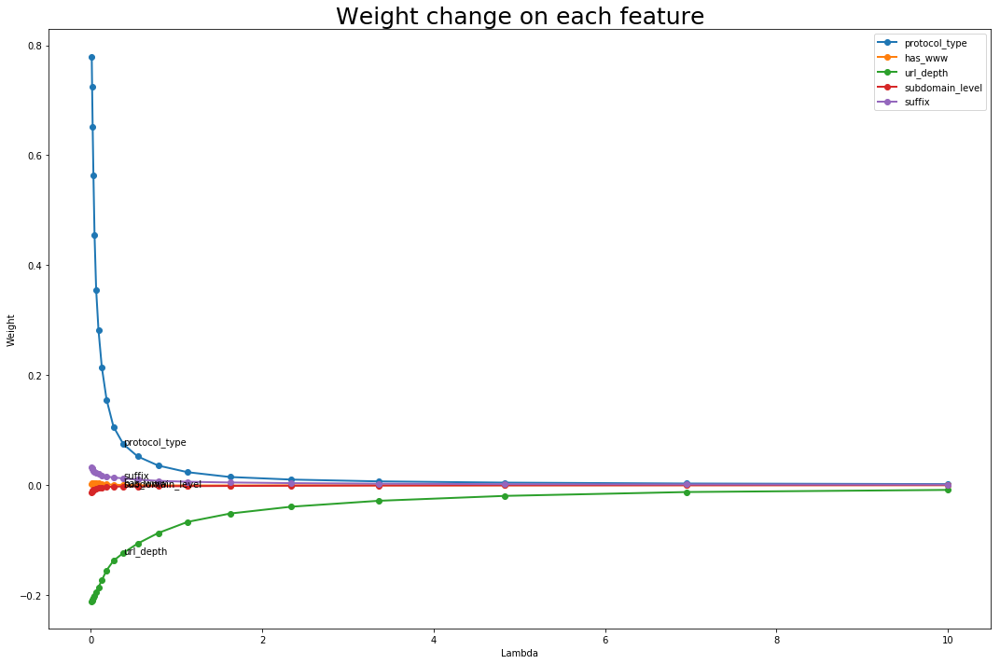

In [25]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

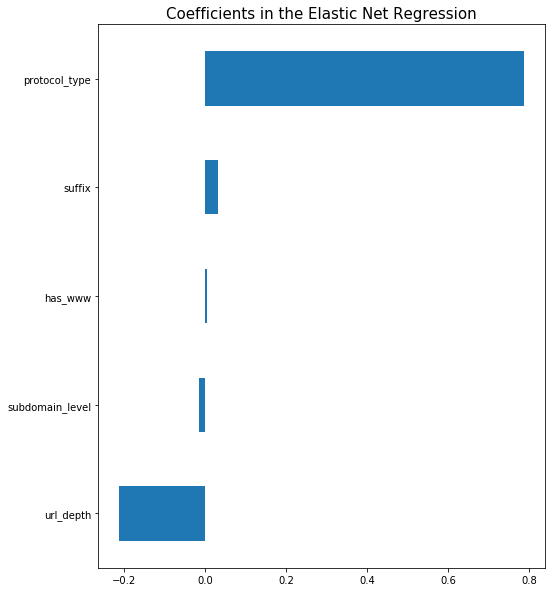

In [26]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

#### Model - 3rd Edition

##### Try Tong's methd

In [27]:
pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('binary_na_encoder', BinaryNAEncoder(['content_type'])),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix_idx',
                                        'is_port_access',
#                                         'first_appear',
#                                         'has_content_type',
                                        'label'
                                       ])),
    ('dummy_suffix_descritizer', DummySuffixDescritizer()),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['protocol_type'])),
    # Low Variance Filter works incorrectly.
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
    ('feature_remover', FeatureRemover([
                                        'param_cnt',
                                        'is_port_access',
                                       ])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])


X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)

Index(['protocol_type', 'has_www', 'int', 'org', 'gov', 'in', 'eu', 'cn',
       'url_depth', 'subdomain_level'],
      dtype='object')
Index(['protocol_type', 'has_www', 'int', 'org', 'gov', 'in', 'eu', 'cn',
       'url_depth', 'subdomain_level'],
      dtype='object')


In [28]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 2.93%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.4745,0.100,14.771,0.000
protocol_type,0.8173,0.106,7.702,0.000
gov,0.5717,0.076,7.554,0.000
in,0.4388,0.234,1.872,0.061
int,0.2764,0.171,1.620,0.105
org,0.1961,0.064,3.056,0.002
subdomain_level,0.0008,0.028,0.028,0.978
eu,0.0005,0.185,0.003,0.998
has_www,-0.0327,0.056,-0.580,0.562
cn,-0.1173,0.238,-0.493,0.622



R^2 on Testing Set: 3.01%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.4745,0.151,9.777,0.000
protocol_type,0.8173,0.161,5.072,0.000
gov,0.5717,0.118,4.863,0.000
in,0.4388,0.383,1.145,0.252
int,0.2764,0.255,1.086,0.277
org,0.1961,0.098,2.001,0.045
subdomain_level,0.0008,0.043,0.018,0.986
eu,0.0005,0.303,0.002,0.999
has_www,-0.0327,0.087,-0.376,0.707
cn,-0.1173,0.360,-0.326,0.745


--- 00 minutes, 16.21 seconds ---


In [29]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': result_train.best_result.residual
}), "Residual Distribution", height=400)

In [30]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': result_train.best_result.residual,
    'prediction': result_train.best_result.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': result_test.best_result.residual,
    'prediction': result_test.best_result.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [31]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 00 minutes, 25.05 seconds ---


In [32]:
performance_matrix = build_visualization_matrix(result_train, result_test)

In [33]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [34]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

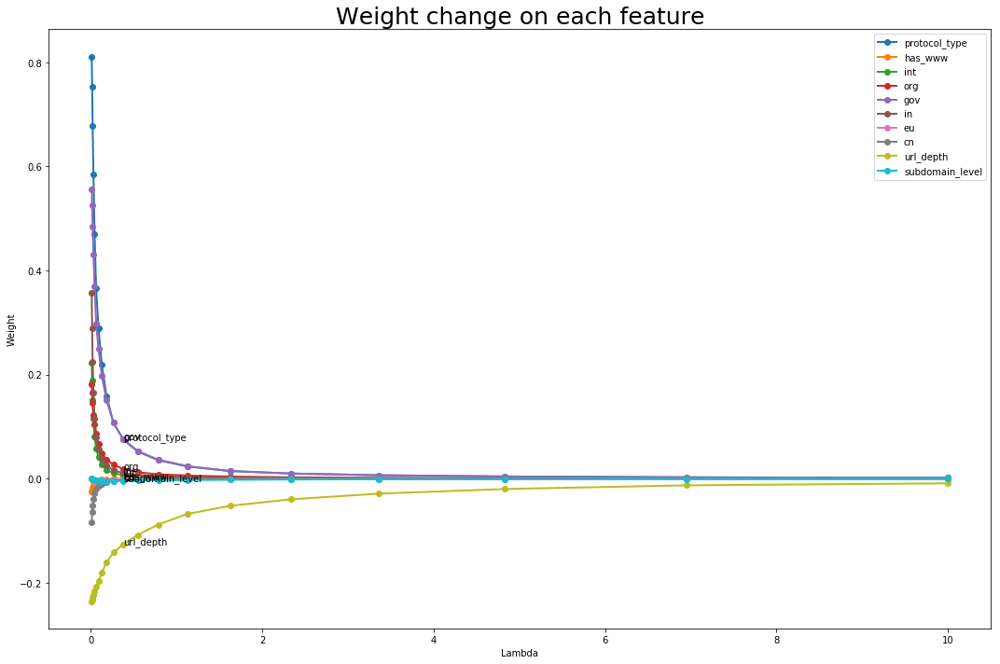

In [35]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

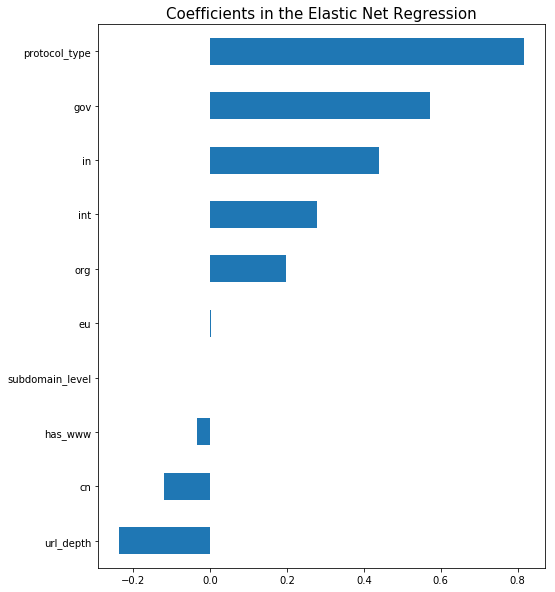

In [36]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

#### Model - 4th Edition - Extract More Features

##### Features in source code

- Restore the test data

In [37]:
# First round pipeline

pipe_1st = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
])

result = pipe_1st.fit_transform(DataSource().train_data)
print(type(result))


<class 'pandas.core.frame.DataFrame'>


- Consolidate the pipeline

In [38]:
pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html5_justifier', HTML5Justifier()),
    ('empty_html_filter', EmptyHTMLFilter()),
    ('html_parser', html_parser),
    ('feature_picker', FeaturePicker(['protocol_type',
                                      'url_depth',
                                      'has_www',
                                      'subdomain_level',
                                      'param_cnt',
                                      'suffix',
                                      'is_port_access',
                                      'code_size',
                                      'title_length',
                                      'internal_js_cnt',
                                      'external_js_cnt',
                                      'charset',
                                      'is_html5',
                                      'has_iframe',
                                      'hyperlink_cnt',
                                      'html_text',
#                                       'first_appear',
                                      'label',
                                       ])),
#     ('logarithm_transformer', LogarithmTransformer(['suffix'])),
#     ('ra w', categorical_encoders.CountFrequencyCategoricalEncoder(
#         encoding_method='frequency',
#         variables=['protocol_type'])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['charset'])),
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

result = pipe.fit_transform(DataSource().train_data)

result[[
    'title_length',
    'internal_js_cnt',
    'external_js_cnt',
    'charset',
    'has_iframe',
    'hyperlink_cnt']].head()

,title_length,internal_js_cnt,external_js_cnt,charset,has_iframe,hyperlink_cnt
0,-0.897666,-0.914151,-0.384683,0.460408,1,-0.387354
1,-0.432946,-0.240553,-0.384683,-2.16623,1,-0.308543
2,0.264134,0.769845,-0.384683,0.460408,1,-0.103633
3,1.1302,-0.240553,-0.384683,-2.16623,1,-0.371592
4,-0.0949681,-0.072153,-0.384683,0.460408,1,-0.387354


In [39]:
pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html5_justifier', HTML5Justifier()),
#     ('empty_html_filter', EmptyHTMLFilter()),
    ('html_parser', html_parser),
    ('binary_feature_converter', FeatureValueMapper('protocol_type', {
                                        'http': 1,
                                        'https':0,
                                        })),
    ('feature_picker', FeaturePicker([
                                        'protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'is_port_access',
#                                         'first_appear',

                                        'code_size',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'charset',
                                        'is_html5',
                                        'has_iframe',
                                        'hyperlink_cnt',
#                                         'html_text',
                                        'label',
                                       ])),
    ('feature_remover', FeatureRemover([
                                        'param_cnt',
                                        'is_port_access',
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['charset'])),
    ('logarithm_transformer', LogarithmTransformer([
                                        'suffix',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'hyperlink_cnt',
#                                         'protocol_type',
#                                         'charset'
    ])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])


X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
print(X_train.columns)
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)


train = X_train.copy()
train.loc[:,'label'] = y_train
test = X_test.copy()
test.loc[:,'label'] = y_test


Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'url_depth',
       'subdomain_level', 'suffix', 'code_size', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_cnt',
       'label'],
      dtype='object')
Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'url_depth',
       'subdomain_level', 'suffix', 'code_size', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_cnt'],
      dtype='object')
Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'url_depth',
       'subdomain_level', 'suffix', 'code_size', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_cnt'],
      dtype='object')


In [40]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 3.31%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.5492,0.117,13.239,0.000
protocol_type,0.6947,0.087,7.961,0.000
internal_js_cnt,0.5029,0.075,6.707,0.000
has_iframe,0.0825,0.079,1.043,0.297
is_html5,0.0528,0.085,0.620,0.535
suffix,0.0407,0.027,1.509,0.131
code_size,0.0256,0.025,1.027,0.305
has_www,0.0176,0.056,0.316,0.752
subdomain_level,-0.0163,0.028,-0.583,0.560
charset,-0.0820,0.035,-2.356,0.019



R^2 on Testing Set: 3.01%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.5492,0.174,8.898,0.000
protocol_type,0.6947,0.130,5.363,0.000
internal_js_cnt,0.5029,0.117,4.282,0.000
has_iframe,0.0825,0.121,0.681,0.496
is_html5,0.0528,0.131,0.403,0.687
suffix,0.0407,0.042,0.971,0.331
code_size,0.0256,0.039,0.660,0.509
has_www,0.0176,0.087,0.202,0.840
subdomain_level,-0.0163,0.043,-0.376,0.707
charset,-0.0820,0.054,-1.512,0.131


--- 00 minutes, 19.62 seconds ---


In [41]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': result_train.best_result.residual
}), "Residual Distribution", height=400)


In [42]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': result_train.best_result.residual,
    'prediction': result_train.best_result.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': result_test.best_result.residual,
    'prediction': result_test.best_result.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [43]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 00 minutes, 26.91 seconds ---


In [44]:
performance_matrix = build_visualization_matrix(result_train, result_test)

In [45]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [46]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

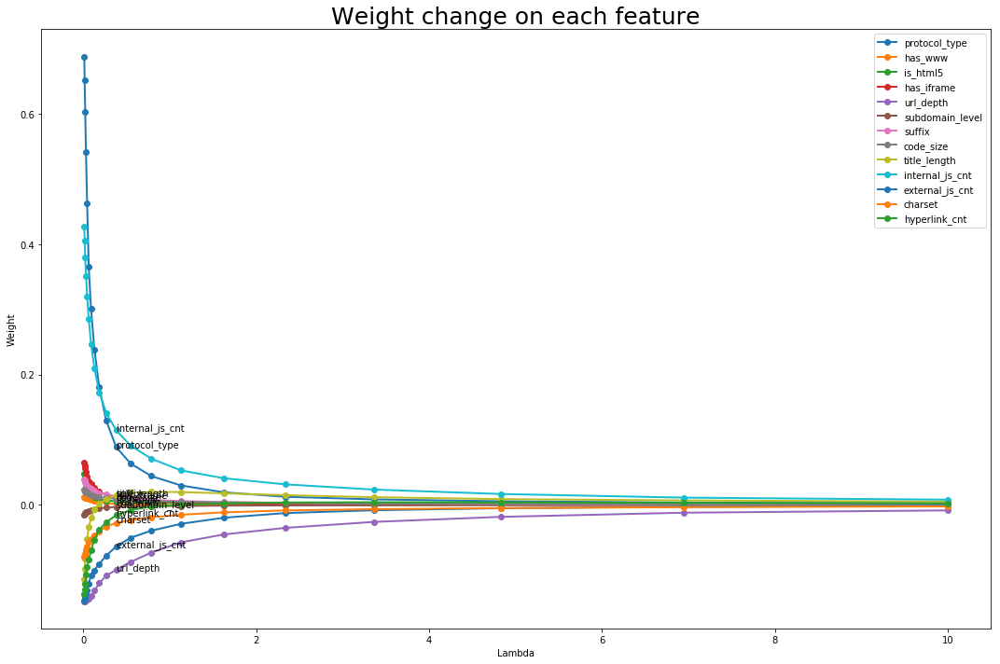

In [47]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

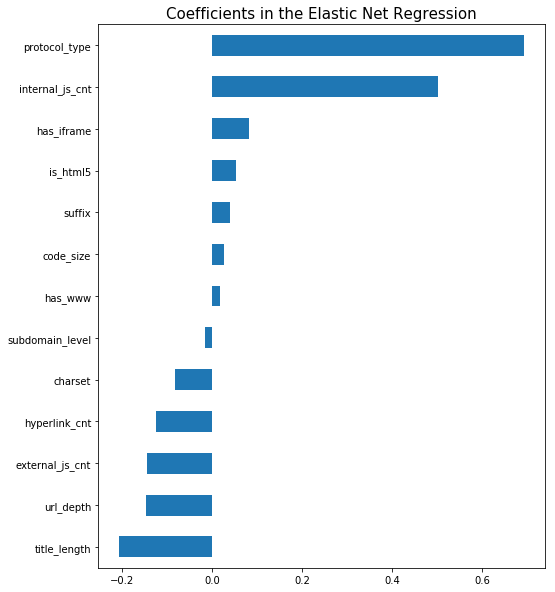

In [48]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

#### Model - 5th Edition - Add Features From MAG

In [49]:
pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html5_justifier', HTML5Justifier()),
#     ('empty_html_filter', EmptyHTMLFilter()),
    ('html_parser', html_parser),
    ('binary_feature_converter', FeatureValueMapper('protocol_type', {
                                        'http': 1,
                                        'https':0,
                                        })),

    ('nan_to_Zero_converter', NanToZeroConverter([
        'total_num_of_paper_citing',
        'total_num_of_author_citing',
        'total_num_of_affiliation_citing',
        'total_num_of_journal_citing',
        'total_num_of_author_self_citation',
        'total_num_of_affiliation_self_citation',
        'total_num_of_journal_self_citation',
        'avg_year',
        'min_year',
        'max_year',
        'median',
        'num_of_author',
        'num_of_author_citing',
        'num_of_affiliation_citing',
        'num_of_journal_citing',
        'avg_hindex',
        'first_author_hindex',
        'last_author_hindex',
        'avg_mid_author_hindex',
        'paper_unique_affiliation'
    ])),
    
    ('feature_picker', FeaturePicker([
                                        'protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'is_port_access',
                                        'code_size',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'charset',
                                        'is_html5',
                                        'has_iframe',
                                        'hyperlink_cnt',
#                                         'first_appear',

                                        'total_num_of_paper_citing',
                                        'total_num_of_author_citing',
                                        'total_num_of_affiliation_citing',
                                        'total_num_of_journal_citing',
                                        'total_num_of_author_self_citation',
                                        'total_num_of_affiliation_self_citation',
                                        'total_num_of_journal_self_citation',
                                        'avg_year',
                                        'min_year',
                                        'max_year',
                                        'median',
                                        'num_of_author',
                                        'num_of_author_citing',
                                        'num_of_affiliation_citing',
                                        'num_of_journal_citing',
                                        'avg_hindex',
                                        'first_author_hindex',
                                        'last_author_hindex',
                                        'avg_mid_author_hindex',
                                        'paper_unique_affiliation',

                                        'label',
                                       ])),
    ('feature_remover', FeatureRemover([
                                        'param_cnt',
                                        'is_port_access',
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['charset'])),
    ('logarithm_transformer', LogarithmTransformer([
                                        'suffix',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'hyperlink_cnt',
#                                         'protocol_type',
#                                         'charset'
    ])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)


train = X_train.copy()
train.loc[:,'label'] = y_train
test = X_test.copy()
test.loc[:,'label'] = y_test


Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'url_depth',
       'subdomain_level', 'suffix', 'code_size', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_cnt',
       'total_num_of_paper_citing', 'total_num_of_author_citing',
       'total_num_of_affiliation_citing', 'total_num_of_journal_citing',
       'total_num_of_author_self_citation',
       'total_num_of_affiliation_self_citation',
       'total_num_of_journal_self_citation', 'avg_year', 'min_year',
       'max_year', 'median', 'num_of_author', 'num_of_author_citing',
       'num_of_affiliation_citing', 'num_of_journal_citing', 'avg_hindex',
       'first_author_hindex', 'last_author_hindex', 'avg_mid_author_hindex',
       'paper_unique_affiliation'],
      dtype='object')
Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'url_depth',
       'subdomain_level', 'suffix', 'code_size', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_c

In [50]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 4.92%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.7241,0.117,14.781,0.000
protocol_type,0.6084,0.087,6.989,0.000
internal_js_cnt,0.3983,0.075,5.340,0.000
total_num_of_paper_citing,0.2681,0.146,1.836,0.066
total_num_of_journal_citing,0.1367,0.161,0.848,0.396
num_of_author_citing,0.1316,0.141,0.932,0.351
total_num_of_author_self_citation,0.0856,0.043,1.975,0.048
suffix,0.0266,0.027,0.992,0.321
total_num_of_journal_self_citation,0.0249,0.026,0.956,0.339
num_of_author,0.0222,0.038,0.586,0.558



R^2 on Testing Set: 3.18%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.7241,0.175,9.832,0.000
protocol_type,0.6084,0.131,4.656,0.000
internal_js_cnt,0.3983,0.118,3.371,0.001
total_num_of_paper_citing,0.2681,0.299,0.898,0.369
total_num_of_journal_citing,0.1367,0.313,0.437,0.662
num_of_author_citing,0.1316,0.357,0.369,0.712
total_num_of_author_self_citation,0.0856,0.074,1.153,0.249
suffix,0.0266,0.042,0.631,0.528
total_num_of_journal_self_citation,0.0249,0.041,0.602,0.547
num_of_author,0.0222,0.117,0.190,0.850


--- 00 minutes, 32.17 seconds ---


In [51]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': result_train.best_result.residual
}), "Residual Distribution", height=400)

In [52]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': result_train.best_result.residual,
    'prediction': result_train.best_result.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': result_test.best_result.residual,
    'prediction': result_test.best_result.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [53]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 00 minutes, 33.83 seconds ---


In [54]:
performance_matrix = build_visualization_matrix(result_train, result_test)

In [55]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [56]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

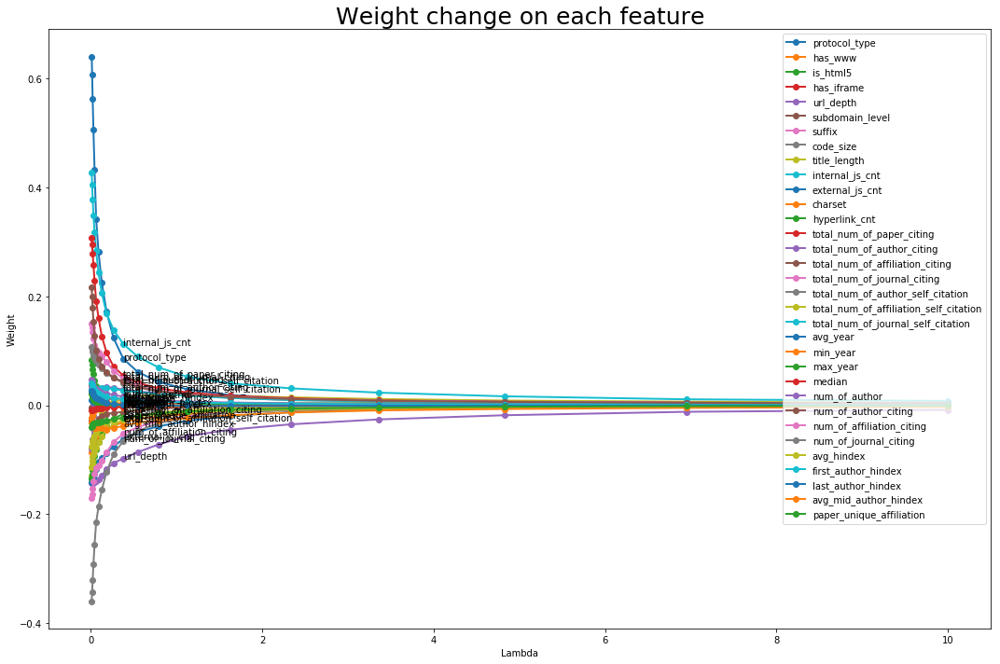

In [57]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

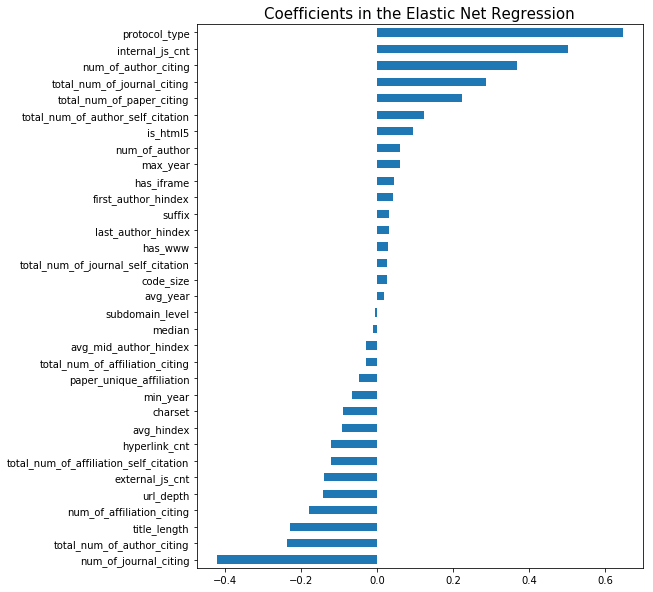

In [58]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

#### 6th Edition - Combine suffix dummy with MAG

In [59]:
pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('binary_na_encoder', BinaryNAEncoder(['content_type'])),
    ('html_parser', html_parser),
    ('binary_feature_converter', FeatureValueMapper('protocol_type', {
                                        'http': 1,
                                        'https':0,
                                        })),

    ('nan_to_Zero_converter', NanToZeroConverter([
        'total_num_of_paper_citing',
        'total_num_of_author_citing',
        'total_num_of_affiliation_citing',
        'total_num_of_journal_citing',
        'total_num_of_author_self_citation',
        'total_num_of_affiliation_self_citation',
        'total_num_of_journal_self_citation',
        'avg_year',
        'min_year',
        'max_year',
        'median',
        'num_of_author',
        'num_of_author_citing',
        'num_of_affiliation_citing',
        'num_of_journal_citing',
        'avg_hindex',
        'first_author_hindex',
        'last_author_hindex',
        'avg_mid_author_hindex',
        'paper_unique_affiliation'
    ])),
    
    ('feature_picker', FeaturePicker([
                                        'protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix_idx',
                                        'is_port_access',
                                        'code_size',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'charset',
                                        'is_html5',
                                        'has_iframe',
                                        'hyperlink_cnt',
#                                         'first_appear',

                                        'total_num_of_paper_citing',
                                        'total_num_of_author_citing',
                                        'total_num_of_affiliation_citing',
                                        'total_num_of_journal_citing',
                                        'total_num_of_author_self_citation',
                                        'total_num_of_affiliation_self_citation',
                                        'total_num_of_journal_self_citation',
                                        'avg_year',
                                        'min_year',
                                        'max_year',
                                        'median',
                                        'num_of_author',
                                        'num_of_author_citing',
                                        'num_of_affiliation_citing',
                                        'num_of_journal_citing',
                                        'avg_hindex',
                                        'first_author_hindex',
                                        'last_author_hindex',
                                        'avg_mid_author_hindex',
                                        'paper_unique_affiliation',

                                        'label',
                                       ])),
    ('dummy_suffix_descritizer', DummySuffixDescritizer()),

    ('feature_remover', FeatureRemover([
                                        'is_port_access',
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['charset'])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)


train = X_train.copy()
train.loc[:,'label'] = y_train
test = X_test.copy()
test.loc[:,'label'] = y_test


Index(['protocol_type', 'has_www', 'has_iframe', 'int', 'org', 'gov', 'in',
       'eu', 'cn', 'url_depth', 'subdomain_level', 'param_cnt', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_cnt',
       'total_num_of_paper_citing', 'total_num_of_author_citing',
       'total_num_of_affiliation_citing', 'total_num_of_journal_citing',
       'total_num_of_author_self_citation',
       'total_num_of_affiliation_self_citation',
       'total_num_of_journal_self_citation', 'avg_year', 'min_year',
       'max_year', 'median', 'num_of_author', 'num_of_author_citing',
       'num_of_affiliation_citing', 'num_of_journal_citing', 'avg_hindex',
       'first_author_hindex', 'last_author_hindex', 'avg_mid_author_hindex',
       'paper_unique_affiliation'],
      dtype='object')
Index(['protocol_type', 'has_www', 'has_iframe', 'int', 'org', 'gov', 'in',
       'eu', 'cn', 'url_depth', 'subdomain_level', 'param_cnt', 'title_length',
       'internal_js_cnt', 'externa

In [60]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 4.79%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.5851,0.114,13.860,0.000
protocol_type,0.6586,0.087,7.554,0.000
gov,0.4854,0.076,6.371,0.000
total_num_of_paper_citing,0.2627,0.146,1.794,0.073
num_of_author_citing,0.1343,0.141,0.950,0.342
total_num_of_journal_citing,0.1283,0.162,0.794,0.427
total_num_of_author_self_citation,0.0984,0.043,2.269,0.023
org,0.0919,0.064,1.433,0.152
total_num_of_journal_self_citation,0.0354,0.026,1.358,0.175
num_of_author,0.0235,0.038,0.620,0.535



R^2 on Testing Set: 3.45%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.5851,0.173,9.177,0.000
protocol_type,0.6586,0.131,5.026,0.000
gov,0.4854,0.120,4.034,0.000
total_num_of_paper_citing,0.2627,0.299,0.879,0.379
num_of_author_citing,0.1343,0.357,0.377,0.707
total_num_of_journal_citing,0.1283,0.313,0.409,0.682
total_num_of_author_self_citation,0.0984,0.074,1.326,0.185
org,0.0919,0.099,0.927,0.354
total_num_of_journal_self_citation,0.0354,0.041,0.855,0.392
num_of_author,0.0235,0.117,0.200,0.841


--- 00 minutes, 33.85 seconds ---


In [61]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': result_train.best_result.residual
}), "Residual Distribution", height=400)

In [62]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': result_train.best_result.residual,
    'prediction': result_train.best_result.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': result_test.best_result.residual,
    'prediction': result_test.best_result.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [63]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 00 minutes, 34.56 seconds ---


In [64]:
performance_matrix = build_visualization_matrix(result_train, result_test)

In [65]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [66]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

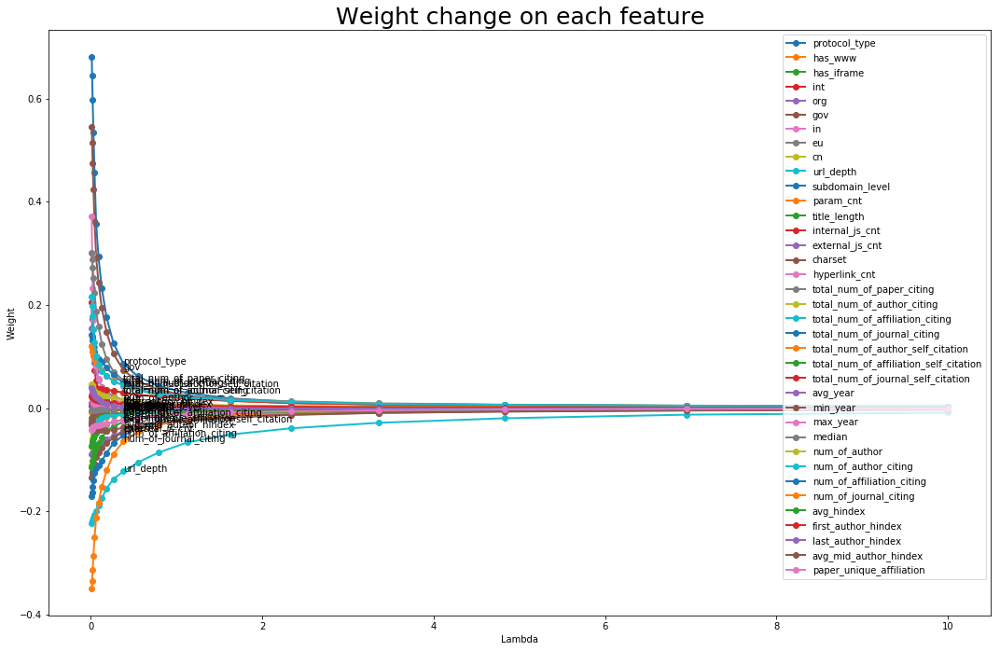

In [67]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

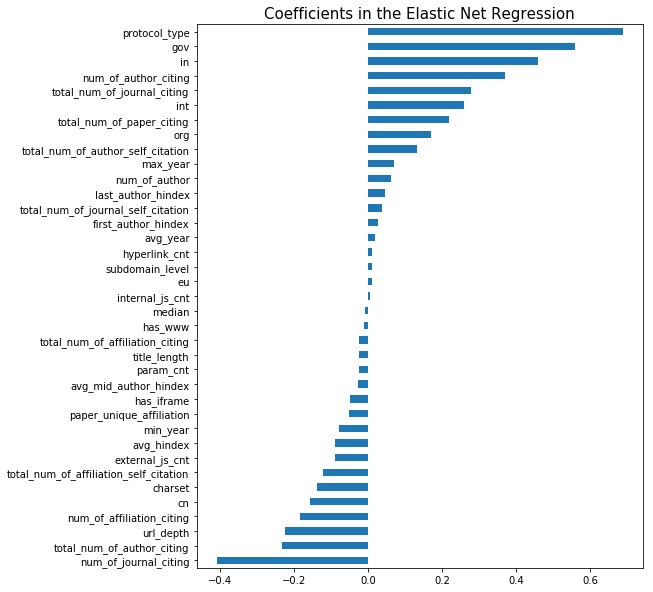

In [68]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")